In [4]:
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.models import efficientnet_b0
from torch import nn, optim
from torch.utils.data import DataLoader, random_split
import pandas as pd
from PIL import Image
from sklearn.metrics import f1_score, accuracy_score
import os

BASE_DIR = "./images/"
IMAGE_DIR = BASE_DIR+"Train/"


In [5]:
class MIMICDataset(torch.utils.data.Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform
        self.disease_cols = [col for col in df.columns
                             if col not in ['image name','label']]

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image = Image.open(IMAGE_DIR+row['image name']).convert("L")
        if self.transform:
            image = self.transform(image)
        label = torch.tensor(row[self.disease_cols].values.astype(np.float32))
        return image, label

In [1]:
!cp drive/MyDrive/ML/images.zip .

In [3]:
!mv /images/ /content/

In [ ]:
df = pd.read_csv(BASE_DIR+"train.csv")
df = df[:int(len(df)*0.5)] # 50%
unique_diseases = set()

for label_str in df['label'].dropna():
    if label_str.strip() == "No Finding":
        continue
    diseases_in_row = [d.strip() for d in label_str.split(',') if d.strip() != '']
    for disease in diseases_in_row:
        unique_diseases.add(disease)

unique_diseases = sorted(list(unique_diseases))

for disease in unique_diseases:
    df[disease] = 0

for idx, label_str in df['label'].items():
    if pd.isna(label_str) or label_str.strip() == "No Finding":
        continue
    diseases_in_row = [d.strip() for d in label_str.split(',') if d.strip() != '']
    for disease in diseases_in_row:
        if disease in unique_diseases:
            df.at[idx, disease] = 1

In [7]:
train_transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485], std=[0.229])
])

val_transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485], std=[0.229])
])

In [9]:
transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

In [10]:
train_size = int(0.8 * len(df))
val_size = int(0.1 * len(df))
test_size = len(df) - train_size - val_size
train_df, val_df, test_df = random_split(df, [train_size, val_size, test_size])

In [11]:
train_set = MIMICDataset(train_df.dataset.iloc[train_df.indices], transform=train_transform)
val_set = MIMICDataset(val_df.dataset.iloc[val_df.indices], transform=val_transform)
test_set = MIMICDataset(test_df.dataset.iloc[test_df.indices], transform=transform_test)

In [12]:
train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader = DataLoader(val_set, batch_size=32)

In [13]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 24.4 MB/s eta 0:00:00


In [22]:
from sklearn.metrics import roc_auc_score
def compute_val_auc(model, dataloader, device, num_labels=11):
    model.eval()
    y_true, y_prob = [], []
    with torch.no_grad():
        for imgs, labels in dataloader:
            imgs  = imgs.to(device)
            labels = labels.float().to(device)
            logits = model(imgs)
            probs  = torch.sigmoid(logits)
            y_true.append(labels.cpu())
            y_prob.append(probs.cpu())
    y_true = torch.cat(y_true).numpy()
    y_prob = torch.cat(y_prob).numpy()
    aucs = []
    for l in range(num_labels):
        if np.unique(y_true[:, l]).size < 2:
            aucs.append(np.nan)
            continue
        aucs.append(roc_auc_score(y_true[:, l], y_prob[:, l]))
    return np.nanmean(aucs)

In [35]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.cuda.amp import autocast, GradScaler
from sklearn.metrics import roc_auc_score
import numpy as np
import optuna
from optuna.pruners import MedianPruner
from optuna.samplers import TPESampler
from pathlib import Path
import time
from tqdm import tqdm


DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def make_mobilenet(dropout_p: float):
    weights = models.MobileNet_V2_Weights.IMAGENET1K_V2
    model   = models.mobilenet_v2(weights=weights)

    w = model.features[0][0].weight.data
    model.features[0][0] = nn.Conv2d(
        in_channels=1,
        out_channels=w.size(0),
        kernel_size=3,
        stride=2,
        padding=1,
        bias=False
    )
    model.features[0][0].weight.data = w.mean(1, keepdim=True)

    in_feats = model.classifier[1].in_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=dropout_p),
        nn.Linear(in_feats, 11)
    )
    return model

def objective(trial):
    lr          = trial.suggest_float("lr", 1e-5, 3e-4, log=True)
    wd          = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
    dropout_p   = trial.suggest_float("dropout", 0.1, 0.5)
    freeze_frac = trial.suggest_float("freeze_frac", 0.0, 0.8)
    epochs      = 6

    model = make_mobilenet(dropout_p).to(DEVICE)

    n_total   = len(list(model.parameters()))
    n_freeze  = int(n_total * freeze_frac)
    for i, p in enumerate(model.parameters()):
        if i < n_freeze:
            p.requires_grad_(False)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
    scaler    = torch.cuda.amp.GradScaler()
    criterion = nn.BCEWithLogitsLoss()

    for epoch in range(epochs):
        model.train()
        for imgs, labels in tqdm(train_loader, desc=f"Epoch {epoch}", leave=False):
            imgs, labels = imgs.to(DEVICE), labels.float().to(DEVICE)
            optimizer.zero_grad(set_to_none=True)
            with torch.cuda.amp.autocast():
                loss = criterion(model(imgs), labels)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

        val_auc = compute_val_auc(model, val_loader, DEVICE)
        trial.report(val_auc, epoch)
        if trial.should_prune():
            raise optuna.TrialPruned()

    return val_auc

if __name__ == "__main__":
    start = time.time()
    sampler = TPESampler(seed=1337, multivariate=True)
    pruner  = MedianPruner(n_startup_trials=5, n_warmup_steps=2)
    study = optuna.create_study(
        study_name="mimic_effnet_bayesian",
        direction="maximize",
        sampler=sampler,
        pruner=pruner,
    )

    study.optimize(objective,
    n_trials=25,
    timeout=1*3600,
    callbacks=[log_intermediates])

    print("Best AUC:  ", study.best_value)
    print("Best params:", study.best_params)

    print(study)

    print(f"Total wall time: {(time.time()-start)/60:.1f} min")


Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast():
Epoch 0:  42%|████▏     | 190/448 [00:30<00:40,  6.33it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 191/448 [00:30<00:40,  6.31it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 192/448 [00:30<00:40,  6.33it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 193/448 [00:30<00:40,  6.28it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` i

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast():
Epoch 0:  42%|████▏     | 190/448 [00:28<00:38,  6.74it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 191/448 [00:28<00:38,  6.69it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 192/448 [00:29<00:38,  6.73it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 193/448 [00:29<00:38,  6.68it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` i

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast():
Epoch 0:  42%|████▏     | 190/448 [00:30<00:42,  6.10it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 191/448 [00:30<00:41,  6.19it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 192/448 [00:30<00:40,  6.25it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 193/448 [00:30<00:42,  6.03it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` i

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast():
Epoch 0:  42%|████▏     | 190/448 [00:29<00:41,  6.20it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 191/448 [00:29<00:40,  6.30it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 192/448 [00:30<00:40,  6.33it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 193/448 [00:30<00:40,  6.24it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` i

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast():
Epoch 0:  42%|████▏     | 190/448 [00:30<00:45,  5.70it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 191/448 [00:30<00:45,  5.66it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 192/448 [00:31<00:45,  5.65it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 193/448 [00:31<00:45,  5.64it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` i

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast():
Epoch 0:  42%|████▏     | 190/448 [00:30<00:40,  6.35it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 191/448 [00:30<00:40,  6.37it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 192/448 [00:30<00:40,  6.36it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 193/448 [00:30<00:40,  6.37it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` i

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
  with torch.cuda.amp.autocast():
Epoch 0:  42%|████▏     | 190/448 [00:31<00:42,  6.10it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 191/448 [00:31<00:42,  6.08it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 192/448 [00:31<00:41,  6.12it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:  43%|████▎     | 193/448 [00:32<00:41,  6.11it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` i

--------------------------------------callback called!---------------------------------


Epoch 0:   0%|          | 0/448 [00:00<?, ?it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:   0%|          | 1/448 [00:00<01:23,  5.36it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:   0%|          | 2/448 [00:00<01:14,  6.01it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:   1%|          | 3/448 [00:00<01:12,  6.18it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:   1

--------------------------------------callback called!---------------------------------


Epoch 0:   0%|          | 0/448 [00:00<?, ?it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:   0%|          | 1/448 [00:00<01:36,  4.62it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:   0%|          | 2/448 [00:00<01:32,  4.84it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:   1%|          | 3/448 [00:00<01:31,  4.89it/s]<ipython-input-35-45c57050d58b>:68: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 0:   1

--------------------------------------callback called!---------------------------------
Best AUC:   0.7277116185403177
Best params: {'lr': 0.00014893934070710639, 'weight_decay': 1.2127875143608901e-05, 'dropout': 0.2664415758283992, 'freeze_frac': 0.46740650248825716}
Total wall time: 64.0 min


In [ ]:
import torch.nn as nn
import torchvision.models as models

def make_inception(dropout_p: float, aux_logits: bool = False):
    weights = models.Inception_V3_Weights.IMAGENET1K_V1
    model = models.inception_v3(
        weights=weights,
        aux_logits=aux_logits,
        transform_input=False
    )
    old_conv = model.Conv2d_1a_3x3.conv
    W = old_conv.weight.data
    new_conv = nn.Conv2d(
        in_channels=1,
        out_channels=W.size(0),
        kernel_size=3,
        stride=2,
        padding=0,
        bias=False,
    )
    new_conv.weight.data = W.mean(1, keepdim=True)
    model.Conv2d_1a_3x3.conv = new_conv

    in_feats = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Dropout(p=dropout_p),
        nn.Linear(in_feats, 11)
    )

    if aux_logits:
        aux_in = model.AuxLogits.fc.in_features
        model.AuxLogits.fc = nn.Linear(aux_in, 11)

    return model
from torch.cuda.amp import autocast, GradScaler
import torch
import optuna

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def objective(trial):
    lr          = trial.suggest_float("lr", 1e-5, 3e-4, log=True)
    wd          = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
    dropout_p   = trial.suggest_float("dropout", 0.1, 0.5)
    freeze_frac = trial.suggest_float("freeze_frac", 0.0, 0.8)
    epochs      = 6

    model = make_inception(dropout_p, aux_logits=True).to(DEVICE)

    params = list(model.parameters())
    n_freeze = int(len(params) * freeze_frac)
    for p in params[:n_freeze]:
        p.requires_grad_(False)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
    criterion = nn.BCEWithLogitsLoss()
    scaler    = GradScaler()

    for epoch in range(epochs):
        model.train()
        for imgs, labels in tqdm(train_loader, desc=f"Epoch {epoch}", leave=False):
            imgs   = imgs.to(DEVICE)
            labels = labels.float().to(DEVICE)

            optimizer.zero_grad(set_to_none=True)
            with autocast():
                main_out, aux_out = model(imgs)
                loss_main = criterion(main_out, labels)
                loss_aux  = criterion(aux_out,  labels)
                loss = loss_main + 0.3 * loss_aux

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

        val_auc = compute_val_auc(model, val_loader, DEVICE)
        trial.report(val_auc, epoch)
        if trial.should_prune():
            raise optuna.TrialPruned()

    return val_auc

sampler = optuna.samplers.TPESampler(seed=42)
pruner  = optuna.pruners.MedianPruner(n_startup_trials=5, n_warmup_steps=2)

study = optuna.create_study(direction="maximize",
                            sampler=sampler, pruner=pruner,
                            study_name="inception_mimic_bayes")

study.optimize(objective, n_trials=25, timeout=1*3600)   # 6 h budget

print("Best macro‑AUC:", study.best_value)
print("Best params   :", study.best_params)


Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 0:  42%|████▏     | 189/448 [00:34<00:47,  5.51it/s]<ipython-input-33-a5cfe24f4232>:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  42%|████▏     | 190/448 [00:34<00:46,  5.54it/s]<ipython-input-33-a5cfe24f4232>:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 191/448 [00:34<00:46,  5.56it/s]<ipython-input-33-a5cfe24f4232>:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 192/448 [00:35<00:45,  5.60it/s]<ipython-input-33-a5cfe24f4232>:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with 

Best macro‑AUC: 0.7149663813624845
Best params   : {'lr': 0.00016967533607196544, 'weight_decay': 4.335281794951567e-06, 'dropout': 0.17272998688284025, 'freeze_frac': 0.14672360788274705}


In [40]:
import pandas as pd
from collections import defaultdict
import optuna

# global store for every epoch of every trial
_history_rows3 = []

def log_intermediates(study: optuna.Study, trial: optuna.trial.FrozenTrial):
    """Optuna 'callbacks' run *after* each trial finishes."""
    # pull the full timeline of that trial: {epoch: auc}
    print("--------------------------------------callback called!---------------------------------")
    for epoch, auc in trial.intermediate_values.items():
        row = {
            "trial":  trial.number,
            "epoch":  epoch,
            "auc":    auc,
            **trial.params
        }
        _history_rows3.append(row)

In [25]:
import torch.nn as nn
import torchvision.models as models
from tqdm import tqdm
import numpy as np

def make_inception(dropout_p: float, aux_logits: bool = False):
    weights = models.Inception_V3_Weights.IMAGENET1K_V1
    model = models.inception_v3(
        weights=weights,
        aux_logits=aux_logits,
        transform_input=False
    )
    old_conv = model.Conv2d_1a_3x3.conv
    W = old_conv.weight.data
    new_conv = nn.Conv2d(
        in_channels=1,
        out_channels=W.size(0),
        kernel_size=3,
        stride=2,
        padding=0,
        bias=False,
    )
    new_conv.weight.data = W.mean(1, keepdim=True)
    model.Conv2d_1a_3x3.conv = new_conv

    in_feats = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Dropout(p=dropout_p),
        nn.Linear(in_feats, 11)
    )

    if aux_logits:
        aux_in = model.AuxLogits.fc.in_features
        model.AuxLogits.fc = nn.Linear(aux_in, 11)

    return model
from torch.cuda.amp import autocast, GradScaler
import torch
import optuna

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def objective(trial):
    lr          = trial.suggest_float("lr", 1e-5, 3e-4, log=True)
    wd          = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
    dropout_p   = trial.suggest_float("dropout", 0.1, 0.5)
    freeze_frac = trial.suggest_float("freeze_frac", 0.0, 0.8)
    epochs      = 6

    model = make_inception(dropout_p, aux_logits=True).to(DEVICE)

    params = list(model.parameters())
    n_freeze = int(len(params) * freeze_frac)
    for p in params[:n_freeze]:
        p.requires_grad_(False)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
    criterion = nn.BCEWithLogitsLoss()
    scaler    = GradScaler()

    for epoch in range(epochs):
        model.train()
        for imgs, labels in tqdm(train_loader, desc=f"Epoch {epoch}", leave=False):
            imgs   = imgs.to(DEVICE)
            labels = labels.float().to(DEVICE)

            optimizer.zero_grad(set_to_none=True)
            with autocast():
                main_out, aux_out = model(imgs)
                loss_main = criterion(main_out, labels)
                loss_aux  = criterion(aux_out,  labels)
                loss = loss_main + 0.3 * loss_aux

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

        val_auc = compute_val_auc(model, val_loader, DEVICE)
        trial.report(val_auc, epoch)
        if trial.should_prune():
            raise optuna.TrialPruned()

    return val_auc

sampler = optuna.samplers.TPESampler(seed=42)
pruner  = optuna.pruners.MedianPruner(n_startup_trials=5, n_warmup_steps=2)

study = optuna.create_study(direction="maximize",
                            sampler=sampler, pruner=pruner,
                            study_name="inception_mimic_bayes")

study.optimize(
    objective,
    n_trials=25,
    timeout=1*3600,
    callbacks=[log_intermediates]
)

print("Best macro‑AUC:", study.best_value)
print("Best params   :", study.best_params)


Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 0:  42%|████▏     | 189/448 [00:33<00:45,  5.70it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  42%|████▏     | 190/448 [00:33<00:45,  5.69it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 191/448 [00:33<00:45,  5.68it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 192/448 [00:34<00:45,  5.68it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with 

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 0:  42%|████▏     | 189/448 [00:32<00:43,  5.92it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  42%|████▏     | 190/448 [00:32<00:43,  5.94it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 191/448 [00:32<00:43,  5.85it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 192/448 [00:32<00:43,  5.85it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with 

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 0:  42%|████▏     | 189/448 [00:31<00:42,  6.14it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  42%|████▏     | 190/448 [00:31<00:41,  6.17it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 191/448 [00:32<00:41,  6.18it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 192/448 [00:32<00:41,  6.14it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with 

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 0:  42%|████▏     | 189/448 [00:36<00:49,  5.19it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  42%|████▏     | 190/448 [00:36<00:50,  5.11it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 191/448 [00:36<00:50,  5.13it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 192/448 [00:37<00:49,  5.17it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with 

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 0:  42%|████▏     | 189/448 [00:35<00:49,  5.25it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  42%|████▏     | 190/448 [00:36<00:48,  5.28it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 191/448 [00:36<00:48,  5.28it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 192/448 [00:36<00:48,  5.30it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with 

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 0:  42%|████▏     | 189/448 [00:35<00:48,  5.32it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  42%|████▏     | 190/448 [00:35<00:48,  5.32it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 191/448 [00:35<00:47,  5.38it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 192/448 [00:35<00:48,  5.30it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with 

--------------------------------------callback called!---------------------------------


Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 0:  42%|████▏     | 189/448 [00:34<00:45,  5.66it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  42%|████▏     | 190/448 [00:34<00:45,  5.66it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 191/448 [00:35<00:45,  5.66it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 0:  43%|████▎     | 192/448 [00:35<00:46,  5.49it/s]<ipython-input-25-380f20f5d8d5>:75: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with 

--------------------------------------callback called!---------------------------------
Best macro‑AUC: 0.7290087697622177
Best params   : {'lr': 0.00016967533607196544, 'weight_decay': 4.335281794951567e-06, 'dropout': 0.17272998688284025, 'freeze_frac': 0.14672360788274705}


In [41]:
def make_effnet(dropout_p: float):
    weights = models.EfficientNet_B0_Weights.IMAGENET1K_V1
    model = models.efficientnet_b0(weights=weights)

    w = model.features[0][0].weight.data
    model.features[0][0] = nn.Conv2d(1, w.size(0), 3, stride=2, padding=1, bias=False)
    model.features[0][0].weight.data = w.mean(1, keepdim=True)

    in_feats = model.classifier[1].in_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=dropout_p),
        nn.Linear(in_feats, 11)
    )
    return model

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def objective(trial):
    lr          = trial.suggest_float("lr", 1e-5, 3e-4, log=True)
    wd          = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
    dropout_p   = trial.suggest_float("dropout", 0.1, 0.5)
    freeze_frac = trial.suggest_float("freeze_frac", 0.0, 0.8)
    epochs      = 6
    model = make_effnet(dropout_p).to(DEVICE)

    n_total = len(list(model.parameters()))
    n_freeze = int(n_total * freeze_frac)
    for i, p in enumerate(model.parameters()):
        if i < n_freeze:
            p.requires_grad_(False)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
    scaler    = torch.amp.GradScaler()
    criterion = nn.BCEWithLogitsLoss()

    for epoch in range(epochs):
        model.train()
        running_loss = 0.
        for imgs, labels in tqdm(train_loader, desc=f"Epoch {epoch}", leave=False):                # <-- your loader
            imgs  = imgs.to(DEVICE)
            labels = labels.float().to(DEVICE)

            optimizer.zero_grad(set_to_none=True)
            with torch.amp.autocast('cuda'):
                logits = model(imgs)
                loss   = criterion(logits, labels)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            running_loss += loss.item()

        val_auc = compute_val_auc(model, val_loader, DEVICE)
        trial.report(val_auc, epoch)

        if trial.should_prune():
            raise optuna.TrialPruned()

    return val_auc
if __name__ == "__main__":
    start = time.time()
    sampler = TPESampler(seed=1337, multivariate=True)
    pruner  = MedianPruner(n_startup_trials=5, n_warmup_steps=2)
    study = optuna.create_study(
        study_name="mimic_effnet_bayesian",
        direction="maximize",
        sampler=sampler,
        pruner=pruner,
    )

    study.optimize(objective,
    n_trials=25,
    timeout=1*3600,
    callbacks=[log_intermediates])
    print("Best AUC:  ", study.best_value)
    print("Best params:", study.best_params)
    print(f"Total wall time: {(time.time()-start)/60:.1f} min")


/usr/local/lib/python3.11/dist-packages/optuna/_experimental.py:31: ExperimentalWarning: Argument ``multivariate`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-04-30 17:20:02,994] A new study created in memory with name: mimic_effnet_bayesian
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 116MB/s] 
[I 2025-04-30 17:28:31,195] Trial 0 finished with value: 0.7143911913607858 and parameters: {'lr': 2.4380478036384837e-05, 'weight_decay': 2.992622359511943e-06, 'dropout': 0.2112506077977439, 'freeze_frac': 0.36745350977165336}. Best is trial 0 with value: 0.7143911913607858.


--------------------------------------callback called!---------------------------------


[I 2025-04-30 17:36:22,224] Trial 1 finished with value: 0.691354038323853 and parameters: {'lr': 2.9795914622942347e-05, 'weight_decay': 3.590694543970448e-05, 'dropout': 0.20477717022605788, 'freeze_frac': 0.780868227901947}. Best is trial 0 with value: 0.7143911913607858.


--------------------------------------callback called!---------------------------------


[I 2025-04-30 17:44:45,509] Trial 2 finished with value: 0.725274946847205 and parameters: {'lr': 0.00012090825451505415, 'weight_decay': 2.21729092776775e-06, 'dropout': 0.2545100274537438, 'freeze_frac': 0.5028009436317693}. Best is trial 2 with value: 0.725274946847205.


--------------------------------------callback called!---------------------------------


[I 2025-04-30 17:52:58,129] Trial 3 finished with value: 0.6805087652829885 and parameters: {'lr': 1.530120807761923e-05, 'weight_decay': 0.0008925772542723189, 'dropout': 0.27728994745805124, 'freeze_frac': 0.6316466736191226}. Best is trial 2 with value: 0.725274946847205.


--------------------------------------callback called!---------------------------------


[I 2025-04-30 18:01:22,517] Trial 4 finished with value: 0.7225628082131565 and parameters: {'lr': 0.00014893934070710639, 'weight_decay': 1.2127875143608901e-05, 'dropout': 0.2664415758283992, 'freeze_frac': 0.46740650248825716}. Best is trial 2 with value: 0.725274946847205.


--------------------------------------callback called!---------------------------------


[I 2025-04-30 18:09:41,730] Trial 5 finished with value: 0.722814569980148 and parameters: {'lr': 0.0001326984604683623, 'weight_decay': 3.6595291954698483e-06, 'dropout': 0.21526685912481427, 'freeze_frac': 0.5361750865281872}. Best is trial 2 with value: 0.725274946847205.


--------------------------------------callback called!---------------------------------


[I 2025-04-30 18:18:30,453] Trial 6 pruned. 


--------------------------------------callback called!---------------------------------


[I 2025-04-30 18:22:30,970] Trial 7 pruned. 


--------------------------------------callback called!---------------------------------
Best AUC:   0.725274946847205
Best params: {'lr': 0.00012090825451505415, 'weight_decay': 2.21729092776775e-06, 'dropout': 0.2545100274537438, 'freeze_frac': 0.5028009436317693}
Total wall time: 62.5 min


In [27]:
hist_df = pd.DataFrame(_history_rows)
hist_df.to_csv("inception_optuna_history.csv", index=False)
print("Saved", len(hist_df), "rows → inception_optuna_history.csv")

Saved 42 rows → inception_optuna_history.csv


In [28]:
print(hist_df.head())
print("Distinct trials =", hist_df.trial.nunique())
print(hist_df.groupby("trial")["epoch"].max().describe())

   trial  epoch       auc        lr  weight_decay   dropout  freeze_frac
0      0      0  0.661313  0.000036      0.000711  0.392798     0.478927
1      0      1  0.687764  0.000036      0.000711  0.392798     0.478927
2      0      2  0.702122  0.000036      0.000711  0.392798     0.478927
3      0      3  0.701881  0.000036      0.000711  0.392798     0.478927
4      0      4  0.702003  0.000036      0.000711  0.392798     0.478927
Distinct trials = 7
count    7.0
mean     5.0
std      0.0
min      5.0
25%      5.0
50%      5.0
75%      5.0
max      5.0
Name: epoch, dtype: float64


Top 5 trials: [3, 5, 4, 6, 0]


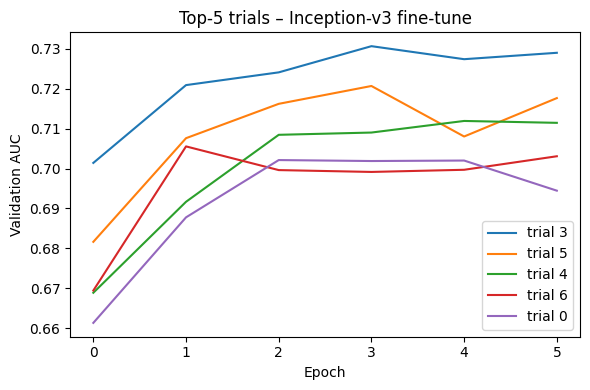

In [36]:
import matplotlib.pyplot as plt

k = 5
top_trials = (
    hist_df.groupby("trial")["auc"].max()
           .nlargest(k)
           .index.tolist()
)
print("Top", k, "trials:", top_trials)

plt.figure(figsize=(6, 4))
for t in top_trials:
    sub = hist_df[hist_df.trial == t]
    plt.plot(sub.epoch, sub.auc, label=f"trial {t}")
plt.xlabel("Epoch")
plt.ylabel("Validation AUC")
plt.title(f"Top-{k} trials – Inception-v3 fine-tune")
plt.legend()
plt.tight_layout()
plt.show()


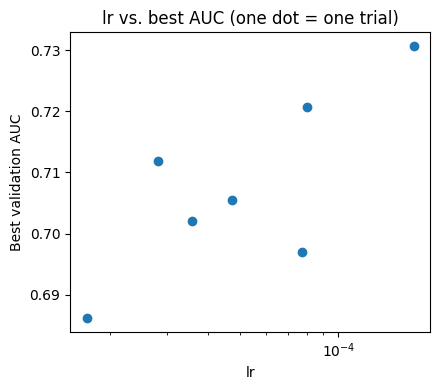

In [37]:
param_name = "lr"
best_by_trial = (
    hist_df.groupby("trial")["auc"].max().rename("best_auc")
    .to_frame()
    .join( hist_df.groupby("trial")[param_name].first() )
)

plt.figure(figsize=(4.5, 4))
plt.scatter(best_by_trial[param_name], best_by_trial["best_auc"])
plt.xscale("log") if param_name == "lr" else None
plt.xlabel(param_name)
plt.ylabel("Best validation AUC")
plt.title(f"{param_name} vs. best AUC (one dot = one trial)")
plt.tight_layout()
plt.show()

Saved 48 rows → inception_optuna_history.csv
Top 5 trials: [4, 5, 6, 2, 0]


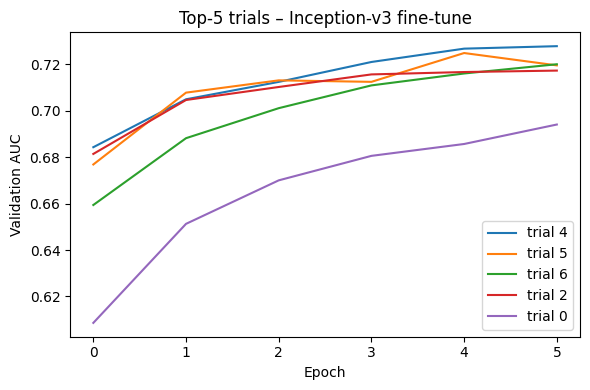

In [38]:
import matplotlib.pyplot as plt
hist_df = pd.DataFrame(_history_rows2)
hist_df.to_csv("inception_optuna_history.csv", index=False)
print("Saved", len(hist_df), "rows → inception_optuna_history.csv")
k = 5
top_trials = (
    hist_df.groupby("trial")["auc"].max()
           .nlargest(k)
           .index.tolist()
)
print("Top", k, "trials:", top_trials)

plt.figure(figsize=(6, 4))
for t in top_trials:
    sub = hist_df[hist_df.trial == t]
    plt.plot(sub.epoch, sub.auc, label=f"trial {t}")
plt.xlabel("Epoch")
plt.ylabel("Validation AUC")
plt.title(f"Top-{k} trials – Inception-v3 fine-tune")
plt.legend()
plt.tight_layout()
plt.show()

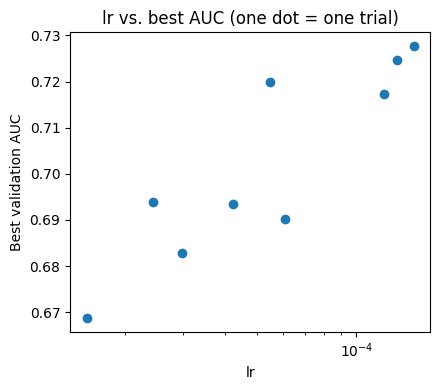

In [39]:
param_name = "lr"
best_by_trial = (
    hist_df.groupby("trial")["auc"].max().rename("best_auc")
    .to_frame()
    .join( hist_df.groupby("trial")[param_name].first() )
)

plt.figure(figsize=(4.5, 4))
plt.scatter(best_by_trial[param_name], best_by_trial["best_auc"])
plt.xscale("log") if param_name == "lr" else None
plt.xlabel(param_name)
plt.ylabel("Best validation AUC")
plt.title(f"{param_name} vs. best AUC (one dot = one trial)")
plt.tight_layout()
plt.show()

Saved 45 rows → inception_optuna_history.csv
Top 5 trials: [2, 4, 5, 6, 0]


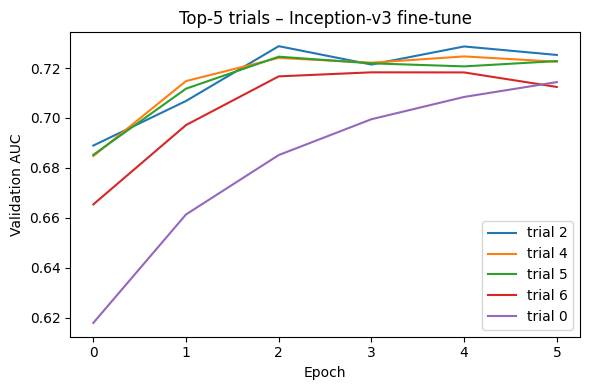

In [42]:
import matplotlib.pyplot as plt
hist_df = pd.DataFrame(_history_rows3)
hist_df.to_csv("inception_optuna_history.csv", index=False)
print("Saved", len(hist_df), "rows → inception_optuna_history.csv")
k = 5
top_trials = (
    hist_df.groupby("trial")["auc"].max()
           .nlargest(k)
           .index.tolist()
)
print("Top", k, "trials:", top_trials)

plt.figure(figsize=(6, 4))
for t in top_trials:
    sub = hist_df[hist_df.trial == t]
    plt.plot(sub.epoch, sub.auc, label=f"trial {t}")
plt.xlabel("Epoch")
plt.ylabel("Validation AUC")
plt.title(f"Top-{k} trials – Inception-v3 fine-tune")
plt.legend()
plt.tight_layout()
plt.show()

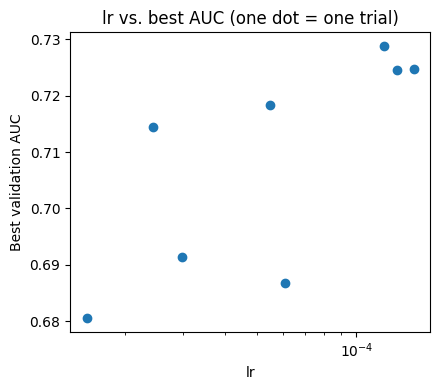

In [43]:
param_name = "lr"
best_by_trial = (
    hist_df.groupby("trial")["auc"].max().rename("best_auc")
    .to_frame()
    .join( hist_df.groupby("trial")[param_name].first() )
)

plt.figure(figsize=(4.5, 4))
plt.scatter(best_by_trial[param_name], best_by_trial["best_auc"])
plt.xscale("log") if param_name == "lr" else None
plt.xlabel(param_name)
plt.ylabel("Best validation AUC")
plt.title(f"{param_name} vs. best AUC (one dot = one trial)")
plt.tight_layout()
plt.show()